# SafeFall AI — Elderly Fall Detection & Activity Monitoring

**FA-2 · Machine Learning & Deep Learning**

This notebook walks through the complete pipeline: raw surveillance video →
pose estimation → feature engineering → labelling → a two-branch CNN →
evaluation → a deployed healthcare dashboard.

It is written to be **run top to bottom in a couple of minutes**. The expensive
step — running MediaPipe over 17 GB of video — is done once by
`python -m src.build_dataset`; this notebook loads the resulting tables and the
trained model, so nothing here takes longer than a few seconds.

| | |
|---|---|
| Pose estimation | MediaPipe Pose (BlazePose), 33 landmarks |
| Classifier | Two-branch 1-D CNN, 127,685 parameters |
| Classes | Fall Detected · Walking · Sitting · Standing · Normal Activity |
| Dataset | Le2i Fall Detection — 190 videos, 6 rooms, 75,911 frames |
| Split | 70/15/15 **at video level** |

## 1. The problem

Falls are the leading cause of injury-related hospitalisation among people over
65. The real danger is usually not the impact — it is the **long lie**, the time
a resident spends on the floor before anyone notices. Every hour on the floor
raises the risk of dehydration, pressure injury and pneumonia, and it is the
strongest single predictor of whether an older adult ever returns to independent
living.

A camera-based monitor cannot prevent the fall, but it can collapse
time-to-discovery from hours to seconds — and unlike a pendant alarm, there is
nothing for the resident to remember to wear.

**The error types are not symmetric.** A missed fall leaves someone on the floor.
A false alarm costs a caregiver five seconds. Every trade-off in this project is
therefore biased toward **recall on the fall class**, and each one is stated
explicitly where it is made.

In [1]:
import json
import sys
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Run from the project root so `src` is importable.
ROOT = Path.cwd() if (Path.cwd() / "src").exists() else Path.cwd().parent
sys.path.insert(0, str(ROOT))

from src import config

plt.rcParams.update({"figure.dpi": 110, "axes.grid": True, "grid.color": "#E3E9F0",
                     "axes.spines.top": False, "axes.spines.right": False})
pd.set_option("display.width", 160)

print("Project root :", ROOT)
print("Classes      :", config.CLASS_NAMES)

Project root : C:\Users\Admin\Desktop\AI\FA 2 Output
Classes      : ['Fall Detected', 'Normal Activity', 'Sitting', 'Standing', 'Walking']


## 2. The dataset

The **Le2i Fall Detection Dataset** (Université de Bourgogne), carried forward
from FA-1: staged falls and activities of daily living in six rooms, 320×240 at
25 FPS.

Each annotation file gives the frame where a fall **begins** and where it
**ends** — genuine human ground truth for the one class that matters most.

In [2]:
videos = pd.read_csv(config.VIDEO_INDEX_CSV)

summary = videos.groupby("subset").agg(
    videos=("video_id", "size"),
    raw_frames=("n_frames", "sum"),
    pose_frames=("n_pose_frames", "sum"),
    videos_with_fall=("contains_fall", "sum"),
    annotated=("has_annotation", "sum"),
)
display(summary)

print(f"Total videos            : {len(videos)}")
print(f"Total raw frames        : {videos.n_frames.sum():,}")
print(f"Videos with a real fall : {videos.contains_fall.sum()}")
print(f"Frames with a skeleton  : {videos.n_pose_frames.sum():,}")

,videos,raw_frames,pose_frames,videos_with_fall,annotated
subset,,,,,
Coffee_room_01,48,14428,4677,47,48
Coffee_room_02,22,13141,4177,12,22
Home_01,30,7175,1807,30,30
Home_02,30,7322,1840,7,30
Lecture_room,27,17293,4314,0,0
Office,33,16552,4655,0,0


Total videos            : 190
Total raw frames        : 75,911
Videos with a real fall : 96
Frames with a skeleton  : 21,470


### Why two groups of videos

130 videos ship with frame-level fall annotations (Coffee room + Home). 60 do
not (Lecture room + Office).

Rather than treat that as a problem, the split is used deliberately:

* **Annotated videos** → the supervised dataset, split 70/15/15.
* **Unannotated videos** → held back entirely as an **unseen-scene generalisation
  set**: two rooms with different furniture, lighting and camera angles that
  appear nowhere in training, validation or test.

That second set is a far harder and more honest test than any random split, and
it is evaluated in section 9.

## 3. Pose estimation

MediaPipe Pose returns 33 full-body landmarks with `(x, y, z, visibility)`.

It was chosen over YOLOv8-Pose and OpenPose because it gives the lower-body
detail a fall analysis needs, runs in real time on a plain CPU, exposes a
per-landmark visibility score (so the system can say *"I can't see this person"*
rather than guess), and — because it works from a skeleton rather than pixels —
is privacy-preserving by construction. That matters when the subject is a
resident under continuous observation.

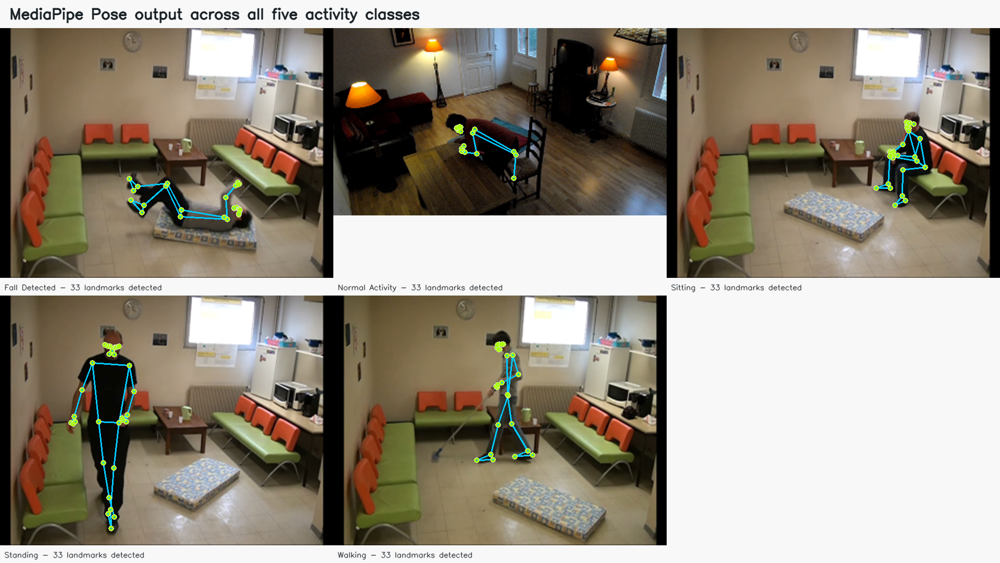

In [3]:
from IPython.display import Image, display as show

grid = config.RESULTS_DIR / "pose_estimation_grid.png"
if grid.exists():
    show(Image(filename=str(grid)))
else:
    print("Run `python -m src.generate_evidence` to create the pose grid.")

### Rejecting unusable skeletons

A frame is only kept if mean landmark visibility ≥ 0.35 **and** the four core
torso landmarks are ≥ 0.5. Everything else is reported as *no person detected*
rather than classified from a broken skeleton.

In [4]:
kept = videos.n_pose_frames.sum()
sampled = (videos.n_frames // config.FRAME_STRIDE).sum()
print(f"Frames sampled (every {config.FRAME_STRIDE}rd) : {sampled:,}")
print(f"Frames with a usable skeleton      : {kept:,}  ({kept / sampled:.1%})")
print(f"Rejected as unusable               : {sampled - kept:,}  ({1 - kept / sampled:.1%})")

Frames sampled (every 3rd) : 25,250
Frames with a usable skeleton      : 21,470  (85.0%)
Rejected as unusable               : 3,780  (15.0%)


## 4. Feature engineering

Every frame becomes **two** representations, and both are recomputed by the same
code at training time and at inference time — so the features the deployed app
sees are provably the features the model was trained on.

**Branch A — normalised skeleton `(33 × 4)`**
Translated to the hip centre and scaled by torso length, so the network learns
*body configuration* rather than where the person stands or how far away they are.

**Branch B — 25 clinical posture descriptors**
The cues a physiotherapist would actually name: trunk angle, knee and hip angles,
bounding-box aspect ratio, body height, stance width, gait asymmetry, mean
visibility. These make the model's decisions explainable — when the dashboard
says *fall*, it can also say *trunk tilted 80° from upright, width/height 1.60*.

In [5]:
from src.pose_utils import compute_geometric_features, normalize_landmarks
from src.data import raw_landmarks

features = pd.read_csv(config.FEATURES_CSV)
print(f"{len(features):,} labelled frames  ×  {features.shape[1]} columns")

sample = raw_landmarks(features.head(1))[0]
print("\nRaw landmark tensor      :", sample.shape)
print("Normalised (branch A)    :", normalize_landmarks(sample).shape)

geo = compute_geometric_features(sample)
print(f"Geometric features (B)   : {len(geo)}\n")
display(pd.DataFrame({"feature": list(geo), "value": np.round(list(geo.values()), 3)}).head(12))

12,501 labelled frames  ×  169 columns

Raw landmark tensor      : (33, 4)
Normalised (branch A)    : (33, 4)
Geometric features (B)   : 25



,feature,value
0,torso_angle,0.600
1,body_axis_angle,9.240
2,bbox_aspect_ratio,0.316
3,bbox_height,0.684
4,bbox_width,0.216
5,hip_y,0.694
6,shoulder_y,0.440
7,ankle_y,0.960
8,head_y,0.367
9,center_of_mass_y,0.619


### The features really do separate the classes

Below, the three most important descriptors are compared between fall frames and
everything else. This is the physical signal the CNN is built on: when a person
goes down, the trunk rotates toward horizontal, the body silhouette becomes wider
than it is tall, and its height collapses.

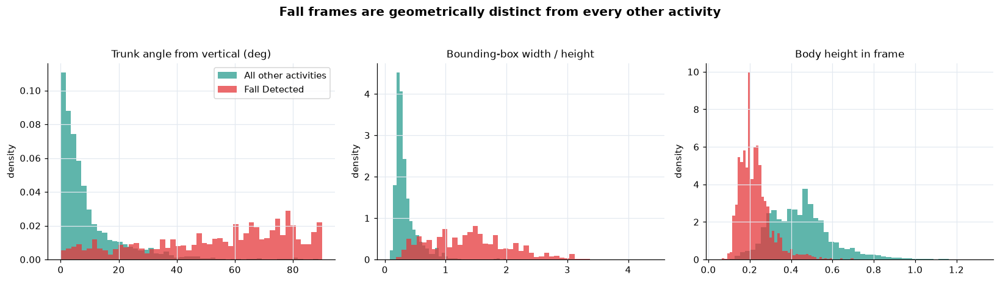

feature                      fall median   other median
geo_torso_angle                    60.58           5.55
geo_bbox_aspect_ratio               1.37           0.28
geo_bbox_height                     0.21           0.44


In [6]:
fall = features[features.activity == config.FALL_CLASS]
safe = features[features.activity != config.FALL_CLASS]

cols = ["geo_torso_angle", "geo_bbox_aspect_ratio", "geo_bbox_height"]
titles = ["Trunk angle from vertical (deg)", "Bounding-box width / height", "Body height in frame"]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, col, title in zip(axes, cols, titles):
    ax.hist(safe[col], bins=50, alpha=0.75, label="All other activities", color="#2A9D8F", density=True)
    ax.hist(fall[col], bins=50, alpha=0.75, label="Fall Detected", color="#E5383B", density=True)
    ax.set_title(title, fontsize=11)
    ax.set_ylabel("density")
axes[0].legend()
fig.suptitle("Fall frames are geometrically distinct from every other activity",
             fontsize=13, fontweight="bold", y=1.04)
plt.tight_layout(); plt.show()

print(f"{'feature':<26}{'fall median':>14}{'other median':>15}")
for col in cols:
    print(f"{col:<26}{fall[col].median():>14.2f}{safe[col].median():>15.2f}")

## 5. Labelling — what is ground truth and what is not

This is the most important methodological section in the project, because the
credibility of everything downstream depends on it.

### Fall Detected — human ground truth

A frame is a fall **if and only if** it lies inside the annotated
`[fall_start, fall_end]` window, **or** it comes after that window and the
resident is *still on the floor*. No frame in the training set is ever called a
fall on posture evidence alone.

"Still on the floor" is detected two ways:

* **Lying flat** — aspect ratio > 1.15 with the trunk more than 50° from vertical.
* **Height collapse** — the body occupies < 62 % of the vertical space *that same
  person* occupied while upright earlier in the same recording.

The second test was added after inspecting a failure: a resident who falls and
ends up slumped against a couch keeps an upright trunk, so the aspect-ratio test
misses them entirely — even though they are just as much on the floor and just as
much an emergency. Adding it lifted test fall recall from 84.3 % to 87.4 %.

### The other four classes — transparent rules, honestly declared

Le2i does not annotate walking, sitting or standing, so those four classes come
from a published rule set over the same geometric features the network sees
(`src/labeling.py`). Every rule is a statement about body geometry a clinician
could check by eye.

**Two design decisions worth defending:**

*The rules are single-frame observable.* An earlier version defined Walking as
"upright **and moving**". That is the correct everyday definition — but the
classifier sees **one frame at a time**, and motion is invisible in one frame.
The target was literally undecidable from the input, and validation accuracy
plateaued at 75 %. Redefining Walking and Standing by **stance width** — which
*is* visible in one frame — made the task well-posed and lifted validation
accuracy to 84.8 %. Motion moved to where the evidence exists: the video pipeline.

*Normal Activity is defined positively.* It began as the residual "everything
else" bucket and was by far the worst class (47.8 % recall) — a model cannot
learn "whatever the other rules rejected". Redefining it as *inclined trunk:
bending, reaching, crouching* gave it a real, clinically meaningful identity, and
overall accuracy rose from 78.9 % to 82.8 %.

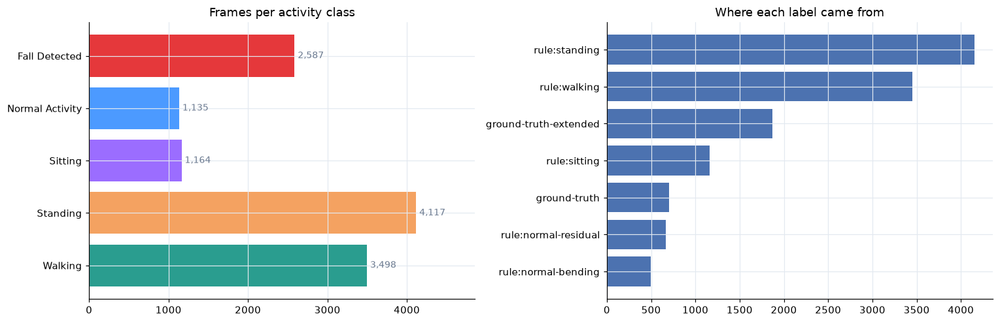

Fall frames from human annotation : 2,577 (20.6% of the dataset)
Every other label is a documented geometric rule - see src/labeling.py


In [7]:
counts = features.activity.value_counts().reindex(config.CLASS_NAMES)
provenance = features.label_source.value_counts()

fig, axes = plt.subplots(1, 2, figsize=(14, 4.6))
colors = [config.CLASS_STYLE[c]["color"] for c in counts.index]
axes[0].barh(counts.index[::-1], counts.values[::-1], color=colors[::-1])
for i, v in enumerate(counts.values[::-1]):
    axes[0].text(v + 40, i, f"{v:,}", va="center", fontsize=9, color="#6B7A90")
axes[0].set_title("Frames per activity class"); axes[0].set_xlim(0, counts.max() * 1.18)

axes[1].barh(provenance.index[::-1], provenance.values[::-1], color="#4C72B0")
axes[1].set_title("Where each label came from")
plt.tight_layout(); plt.show()

ground_truth = features.label_source.str.startswith("ground-truth").sum()
print(f"Fall frames from human annotation : {ground_truth:,} "
      f"({ground_truth / len(features):.1%} of the dataset)")
print("Every other label is a documented geometric rule - see src/labeling.py")

### What this means for the results

The four rule-derived classes are learned from a rule the model could in
principle reproduce, so their accuracy partly measures **how well the CNN
generalises an explainable rule to unseen people and rooms**, not how well it
discovers activity from scratch. Stating that plainly changes how the numbers
should be read.

Three things stop it being circular:

1. **The fall class is not rule-derived** — it is human-annotated, and it is the
   class the system exists to detect.
2. **The split is by video** — reproducing a rule on unseen recordings is not the
   same as reproducing it on the frames beside it.
3. **Training data is augmented** — mirrored, rescaled, translated, jittered and
   partly occluded skeletons mean the model cannot survive by memorising
   threshold values.

## 6. The 70 / 15 / 15 split — at video level

Neighbouring frames of the same recording are almost identical. A random
frame-wise split would put near-duplicates on both sides of the fence and report
an accuracy that could never be reproduced on a new resident.

Splitting **whole videos** — stratified by room and by whether the video contains
a fall — keeps the test set genuinely unseen. It reports a lower number than a
frame-wise split would, and it is the only number worth anything.

In [8]:
split_index = pd.read_csv(config.SPLITS_DIR / "video_split_index.csv")
train = pd.read_csv(config.TRAIN_CSV)
val = pd.read_csv(config.VAL_CSV)
test = pd.read_csv(config.TEST_CSV)

rows = []
for name, part in [("train", train), ("val", val), ("test", test)]:
    vids = split_index[split_index.split == name]
    rows.append({
        "split": name,
        "videos": len(vids),
        "video %": f"{len(vids) / len(split_index):.1%}",
        "frames": len(part),
        "frame %": f"{len(part) / (len(train) + len(val) + len(test)):.1%}",
        "videos with a fall": int(vids.contains_fall.sum()),
    })
display(pd.DataFrame(rows))

overlap = set(train.video_id) & (set(val.video_id) | set(test.video_id))
print(f"Videos appearing in both training and held-out data: {len(overlap)}  (must be 0)")

pivot = pd.concat([
    train.assign(split="train"), val.assign(split="val"), test.assign(split="test")
]).pivot_table(index="activity", columns="split", values="frame",
               aggfunc="size", fill_value=0).reindex(config.CLASS_NAMES)
display(pivot[["train", "val", "test"]])

,split,videos,video %,frames,frame %,videos with a fall
0,train,91,70.0%,8425,67.4%,66
1,val,19,14.6%,2101,16.8%,14
2,test,20,15.4%,1975,15.8%,15


Videos appearing in both training and held-out data: 0  (must be 0)


split,train,val,test
activity,,,
Fall Detected,1757,401,429
Normal Activity,676,206,253
Sitting,515,324,325
Standing,2884,689,544
Walking,2593,481,424


## 7. The model

A **two-branch 1-D CNN**. The brief recommends a CNN, and a CNN is genuinely the
right family here — but over the *body*, not over pixels.

A fall is a local geometric pattern along the kinematic chain: hip–knee–ankle
collapsing, shoulder–hip rotating toward horizontal. 1-D convolutions sliding
along the 33-landmark chain share weights across body parts exactly the way 2-D
convolutions share them across image patches, so a filter that learns *"this limb
has folded"* is reused wherever it appears.

```
Branch A — Pose CNN                       Branch B — Clinical features
input (33 landmarks × 4 channels)         input (25 posture descriptors)
  Conv1D(64,  k=3) + ReLU + BN              Dense(64) + ReLU + BN + Dropout(0.30)
  Conv1D(128, k=3) + ReLU + BN                       │
  MaxPool1D(2)            → 16 × 128                 │
  Conv1D(128, k=3) + ReLU + BN                       │
  GlobalAvgPool ⧺ GlobalMaxPool → 256                │
        └────────────────┬─────────────────────────┘
                         ▼
                 Concatenate → 320
                 Dense(128) + ReLU + Dropout(0.45)
                 Dense(64)  + ReLU + Dropout(0.35)
                 Dense(5, softmax)
```

In [9]:
metadata = json.loads(config.METADATA_PATH.read_text())
for key in ["model_name", "framework", "total_parameters", "epochs_run", "best_epoch",
            "best_val_accuracy", "final_train_accuracy", "batch_size", "learning_rate",
            "class_weighted", "training_seconds", "split_granularity"]:
    print(f"  {key:<24}: {metadata[key]}")

  model_name              : SafeFall_PoseCNN
  framework               : TensorFlow 2.17.1 / Keras 3.15.1
  total_parameters        : 127685
  epochs_run              : 18
  best_epoch              : 3
  best_val_accuracy       : 0.8905283212661743
  final_train_accuracy    : 0.9548961520195007
  batch_size              : 64
  learning_rate           : 0.0005
  class_weighted          : True
  training_seconds        : 101.2
  split_granularity       : video-level (no frame leakage between splits)


### Augmentation happens in pose space

Four augmented skeletons are generated per training frame (8,425 → 42,125
samples), and **both** network inputs are recomputed from the transformed body.
Each transform mimics a real failure mode of a wall-mounted camera:

| Transform | Real-world situation |
|---|---|
| Mirror (with left/right landmark swap) | resident walks the other way down the corridor |
| Scale ×0.80–1.25 | resident nearer to or further from the lens |
| Translate ±0.06 | resident in a different part of the room |
| Jitter σ 0.003–0.012 | ordinary landmark noise |
| Occlusion of 1–3 landmarks | a limb hidden behind furniture |
| Rotation ±3° **only** | slightly off-level camera bracket |

Rotation is deliberately tiny. Tilting a skeleton changes its trunk angle — the
very signal separating "upright" from "on the floor" — so a large rotation would
silently relabel the sample without changing its target, injecting **label noise
rather than robustness**. An early version used ±9° and validation accuracy did
not improve at all; restricting it to ±3° was part of what unlocked the later
gains.

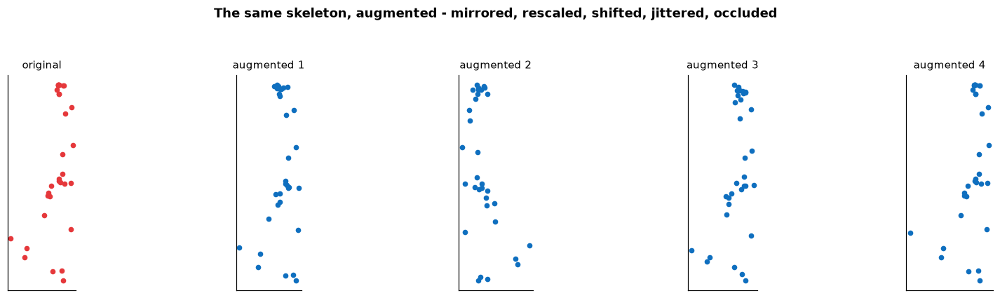

In [10]:
from src.augment import augment_one

rng = np.random.default_rng(0)
original = raw_landmarks(features.head(1))[0]

fig, axes = plt.subplots(1, 5, figsize=(16, 3.6))
for i, ax in enumerate(axes):
    skeleton = original if i == 0 else augment_one(original, rng)
    ax.scatter(skeleton[:, 0], -skeleton[:, 1], s=16,
               c="#E5383B" if i == 0 else "#0F6FBF")
    ax.set_title("original" if i == 0 else f"augmented {i}", fontsize=10)
    ax.set_aspect("equal"); ax.set_xticks([]); ax.set_yticks([]); ax.grid(False)
fig.suptitle("The same skeleton, augmented - mirrored, rescaled, shifted, jittered, occluded",
             fontsize=12, fontweight="bold", y=1.06)
plt.tight_layout(); plt.show()

## 8. Training

Trained with Adam (lr 5e-4, batch 64), inverse-frequency class weights so the
safety-critical class stays influential, early stopping on validation accuracy
with best-weight restore, and learning-rate reduction on plateau.

Hyper-parameters were selected by comparing **validation** accuracy. The test
split was scored once, with the selected configuration.

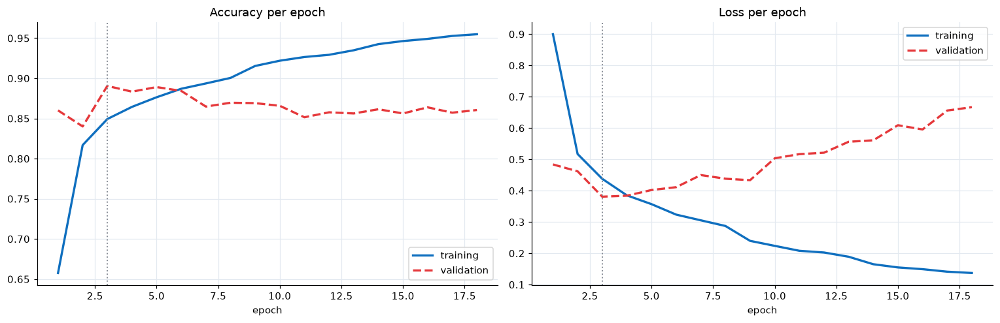

Best validation accuracy 0.8905 at epoch 3
Validation loss rises after that point - the model stops learning general
posture and starts memorising training videos. Early stopping keeps the best epoch.


In [11]:
history = pd.read_csv(config.HISTORY_CSV)

fig, axes = plt.subplots(1, 2, figsize=(14, 4.6))
axes[0].plot(history.epoch, history.accuracy, lw=2.2, color="#0F6FBF", label="training")
axes[0].plot(history.epoch, history.val_accuracy, lw=2.2, ls="--", color="#E5383B", label="validation")
axes[0].set_title("Accuracy per epoch"); axes[0].set_xlabel("epoch"); axes[0].legend()

axes[1].plot(history.epoch, history.loss, lw=2.2, color="#0F6FBF", label="training")
axes[1].plot(history.epoch, history.val_loss, lw=2.2, ls="--", color="#E5383B", label="validation")
axes[1].set_title("Loss per epoch"); axes[1].set_xlabel("epoch"); axes[1].legend()

best = int(history.val_accuracy.idxmax())
for ax in axes:
    ax.axvline(history.epoch[best], color="#8A8F98", ls=":", lw=1.3)
plt.tight_layout(); plt.show()

print(f"Best validation accuracy {history.val_accuracy.max():.4f} at epoch {history.epoch[best]}")
print("Validation loss rises after that point - the model stops learning general")
print("posture and starts memorising training videos. Early stopping keeps the best epoch.")

## 9. Evaluation

Everything below is measured on the **held-out test split**: 1,975 frames from
20 videos never seen in training or validation.

In [12]:
metrics = json.loads((config.RESULTS_DIR / "metrics_summary.json").read_text())

headline = pd.DataFrame({
    "metric": ["Accuracy", "Precision (macro)", "Recall (macro)", "F1-score (macro)",
               "Precision (weighted)", "Recall (weighted)", "F1-score (weighted)"],
    "score": [f"{metrics[k]:.2%}" for k in
              ["test_accuracy", "test_precision_macro", "test_recall_macro", "test_f1_macro",
               "test_precision_weighted", "test_recall_weighted", "test_f1_weighted"]],
})
display(headline)

report = pd.read_csv(config.RESULTS_DIR / "classification_report.csv", index_col=0)
display(report.loc[config.CLASS_NAMES].round(4))

,metric,score
0,Accuracy,81.92%
1,Precision (macro),79.45%
2,Recall (macro),78.97%
3,F1-score (macro),78.83%
4,Precision (weighted),81.47%
5,Recall (weighted),81.92%
6,F1-score (weighted),81.42%


,precision,recall,f1-score,support
Fall Detected,0.7732,0.8741,0.8206,429.0
Normal Activity,0.6284,0.4545,0.5275,253.0
Sitting,0.8102,0.8800,0.8437,325.0
Standing,0.9044,0.8695,0.8866,544.0
Walking,0.8561,0.8703,0.8632,424.0


### The fall class — the metrics that matter clinically

In [13]:
fall_metrics = pd.DataFrame({
    "metric": ["Recall (sensitivity)", "Precision", "F1-score", "ROC-AUC",
               "Average precision", "Recall at deployed alert threshold",
               "Missed falls at deployed threshold"],
    "value": [f"{metrics['fall_recall']:.2%}", f"{metrics['fall_precision']:.2%}",
              f"{metrics['fall_f1']:.4f}", f"{metrics['fall_roc_auc']:.4f}",
              f"{metrics['fall_average_precision']:.4f}",
              f"{metrics['fall_recall_at_alert_threshold']:.2%}",
              f"{metrics['missed_falls_at_alert_threshold']} of {metrics['fall_frames_in_test']}"],
})
display(fall_metrics)

print("An ROC-AUC of {:.3f} means the model almost always assigns a higher fall".format(metrics["fall_roc_auc"]))
print("probability to a fall frame than to a non-fall frame. That is what makes")
print("threshold tuning a legitimate lever rather than wishful thinking.")

,metric,value
0,Recall (sensitivity),87.41%
1,Precision,77.32%
2,F1-score,0.8206
3,ROC-AUC,0.9481
4,Average precision,0.7126
5,Recall at deployed alert threshold,91.84%
6,Missed falls at deployed threshold,35 of 429


An ROC-AUC of 0.948 means the model almost always assigns a higher fall
probability to a fall frame than to a non-fall frame. That is what makes
threshold tuning a legitimate lever rather than wishful thinking.


### Choosing the alert threshold

The alert fires when the fall probability crosses a threshold, and that threshold
is a real clinical lever — not an arbitrary 0.5. It is chosen by an explicit rule
run on the **validation** split only:

> Among all thresholds whose fall-class F1 is within 0.5 % of the best
> achievable, take the one with the **highest recall**.

Validation F1 is almost flat across 0.25–0.50, so that slack costs essentially
nothing and buys recall — the error type that carries the real cost.

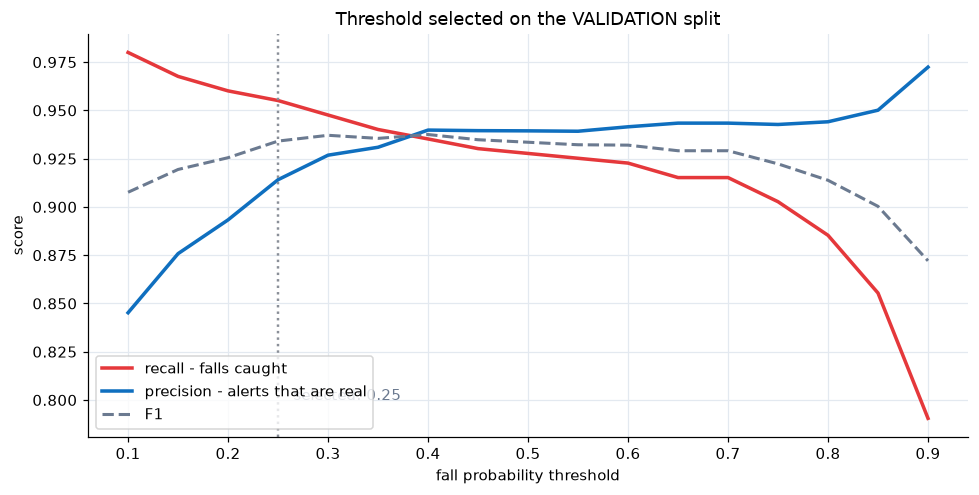

Selected threshold        : 0.25
Validation F1 there       : 0.9341  (best achievable 0.9375)
-> TEST fall recall       : 91.84%
-> TEST fall precision    : 77.41%


In [14]:
sweep = pd.read_csv(config.RESULTS_DIR / "threshold_selection_validation.csv")

fig, ax = plt.subplots(figsize=(9, 4.6))
ax.plot(sweep.threshold, sweep.recall, lw=2.3, color="#E5383B", label="recall - falls caught")
ax.plot(sweep.threshold, sweep.precision, lw=2.3, color="#0F6FBF", label="precision - alerts that are real")
ax.plot(sweep.threshold, sweep.f1, lw=2.0, ls="--", color="#6B7A90", label="F1")
ax.axvline(metrics["selected_threshold"], color="#8A8F98", ls=":", lw=1.6)
ax.annotate(f"selected: {metrics['selected_threshold']:.2f}",
            (metrics["selected_threshold"], 0.80), xytext=(10, 0),
            textcoords="offset points", color="#6B7A90")
ax.set_xlabel("fall probability threshold"); ax.set_ylabel("score")
ax.set_title("Threshold selected on the VALIDATION split"); ax.legend(loc="lower left")
plt.tight_layout(); plt.show()

print(f"Selected threshold        : {metrics['selected_threshold']}")
print(f"Validation F1 there       : {metrics['validation_f1_at_selected']}  (best achievable {metrics['validation_best_f1']})")
print(f"-> TEST fall recall       : {metrics['fall_recall_at_alert_threshold']:.2%}")
print(f"-> TEST fall precision    : {metrics['fall_precision_at_alert_threshold']:.2%}")

### The confusion matrix, read properly

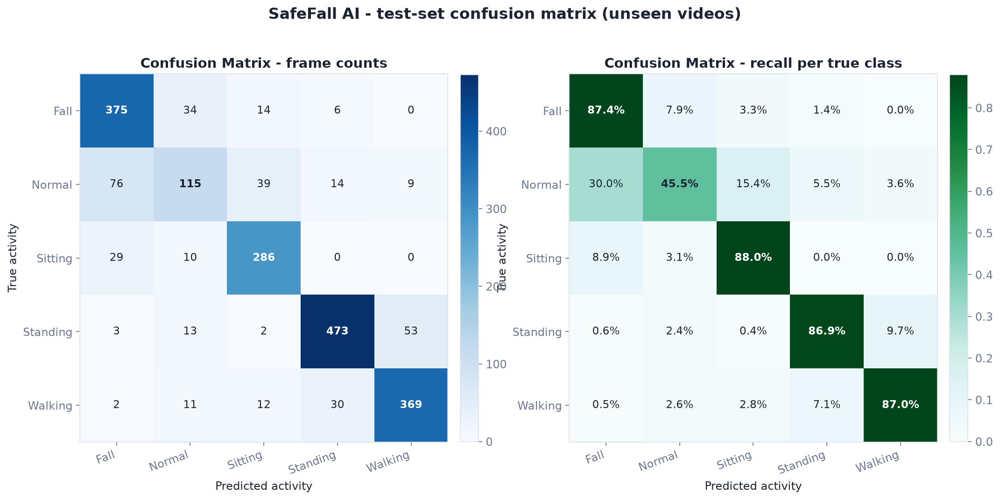

CONFUSION MATRIX ANALYSIS - SafeFall AI test set
Test frames analysed              : 1,975
Frames that really were a fall    : 429

1. FALL DETECTION (the safety-critical row)
--------------------------------------------------------------------
   Correct fall detections        : 375 of 429 (87.4% recall / sensitivity)
   Missed falls (false negatives) : 54 (12.6% of all falls)
   False alarms (false positives) : 110 (7.12% of all non-fall frames)
   Specificity on non-fall frames : 92.88%

   Reading: recall matters most here. Every missed fall is an elderly
   resident left on the floor unattended, whereas a false alarm only
   costs a caregiver a few seconds to dismiss.

2. WHERE THE FALL ALERTS COME FROM
--------------------------------------------------------------------
       76 frames of 'Normal Activity' were alerted as a fall (30.04% of that activity)
       29 frames of 'Sitting' were alerted as a fall (8.92% of that activity)
        3 frames of 'Standing' were alerted as a

In [15]:
show(Image(filename=str(config.RESULTS_DIR / "confusion_matrix.png")))
print((config.RESULTS_DIR / "confusion_matrix_analysis.txt").read_text())

### Testing on genuinely unseen data

The rubric asks for validation data, test data and new material. All three were
used — and the third is the strongest evidence in the project.

The Lecture room and Office subsets are **59 videos in two rooms that appear in
no split at all**: different furniture, different lighting, different camera
angles.

In [16]:
rows = [
    {"evaluation": "Validation split (19 unseen videos)", "frames": metrics["val_frames"],
     "result": f"{metrics['validation_accuracy']:.2%} accuracy"},
    {"evaluation": "Test split (20 unseen videos)", "frames": metrics["test_frames"],
     "result": f"{metrics['test_accuracy']:.2%} accuracy, {metrics['fall_recall']:.2%} fall recall"},
    {"evaluation": "Unseen ROOMS (59 videos, Lecture room + Office)",
     "frames": metrics["unseen_scene_frames"],
     "result": f"{metrics['unseen_scene_agreement']:.2%} agreement, "
               f"{metrics['unseen_scene_fall_recall']:.2%} fall recall"},
]
display(pd.DataFrame(rows))

print(f"Test accuracy        : {metrics['test_accuracy']:.2%}")
print(f"Unseen-room agreement: {metrics['unseen_scene_agreement']:.2%}")
print()
print("Those two figures being nearly identical is the headline result:")
print("the model is not memorising a room.")
print()
print("Fall recall does fall to {:.1%} in the unseen rooms, and that is worth".format(metrics["unseen_scene_fall_recall"]))
print("stating plainly. Those rooms have no annotation files, so their fall")
print("reference comes from the posture rule rather than human annotation - part")
print("of the gap is reference noise. But it is also a fair warning that a new")
print("room should be validated before the system is trusted in it.")

,evaluation,frames,result
0,Validation split (19 unseen videos),2101,89.05% accuracy
1,Test split (20 unseen videos),1975,"81.92% accuracy, 87.41% fall recall"
2,"Unseen ROOMS (59 videos, Lecture room + Office)",8969,"81.24% agreement, 70.05% fall recall"


Test accuracy        : 81.92%
Unseen-room agreement: 81.24%

Those two figures being nearly identical is the headline result:
the model is not memorising a room.

Fall recall does fall to 70.1% in the unseen rooms, and that is worth
stating plainly. Those rooms have no annotation files, so their fall
reference comes from the posture rule rather than human annotation - part
of the gap is reference noise. But it is also a fair warning that a new
room should be validated before the system is trusted in it.


### Where the model gets it wrong

Showing only the successes would not be an honest evaluation.

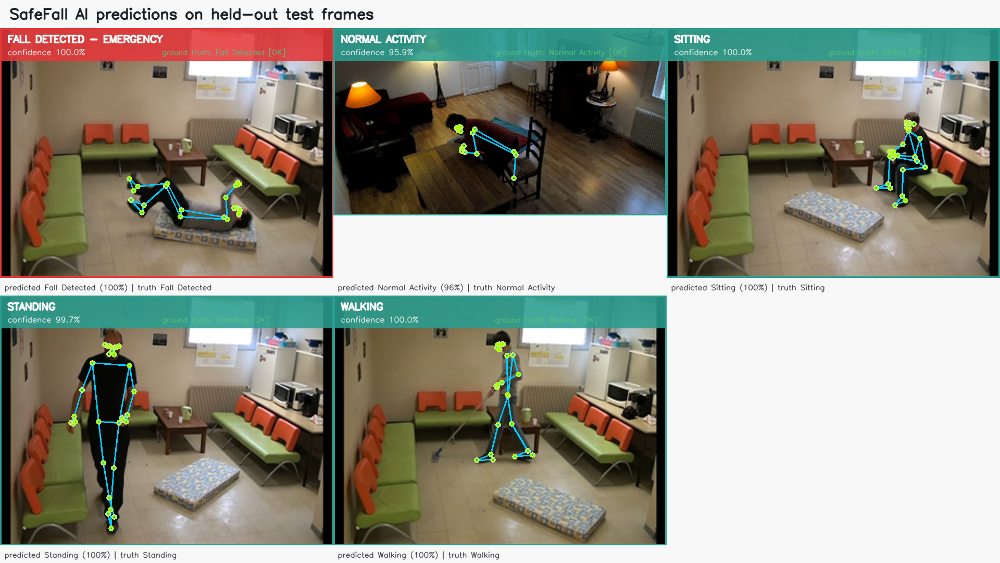

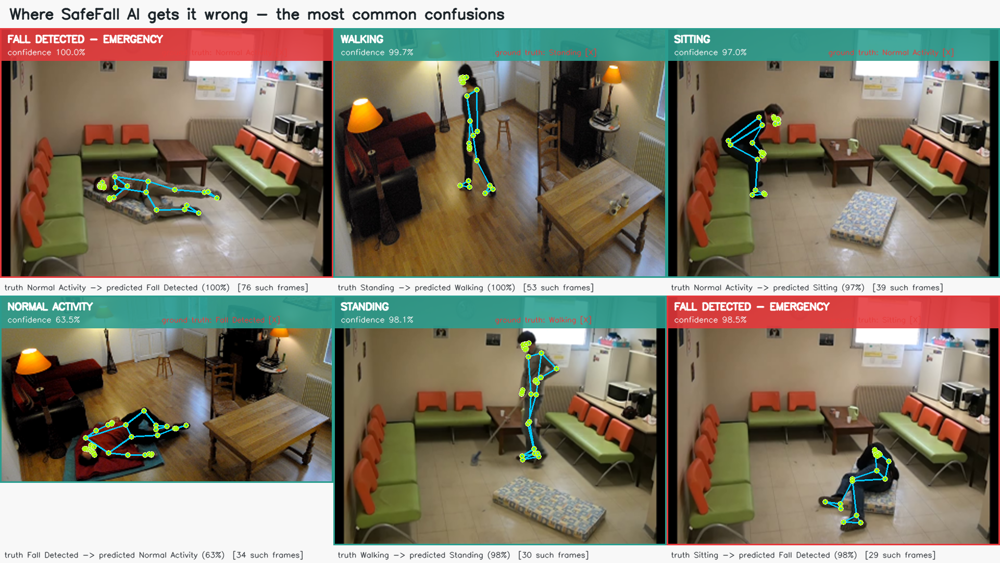

In [17]:
for name in ["prediction_grid.png", "misclassification_examples.png"]:
    path = config.RESULTS_DIR / name
    if path.exists():
        show(Image(filename=str(path)))

## 10. A real fall, frame by frame

This is the whole system working end to end on a held-out test recording: the
resident walks, falls, and stays on the floor — and the alert fires at the right
moment and **stays latched** while they are still down.

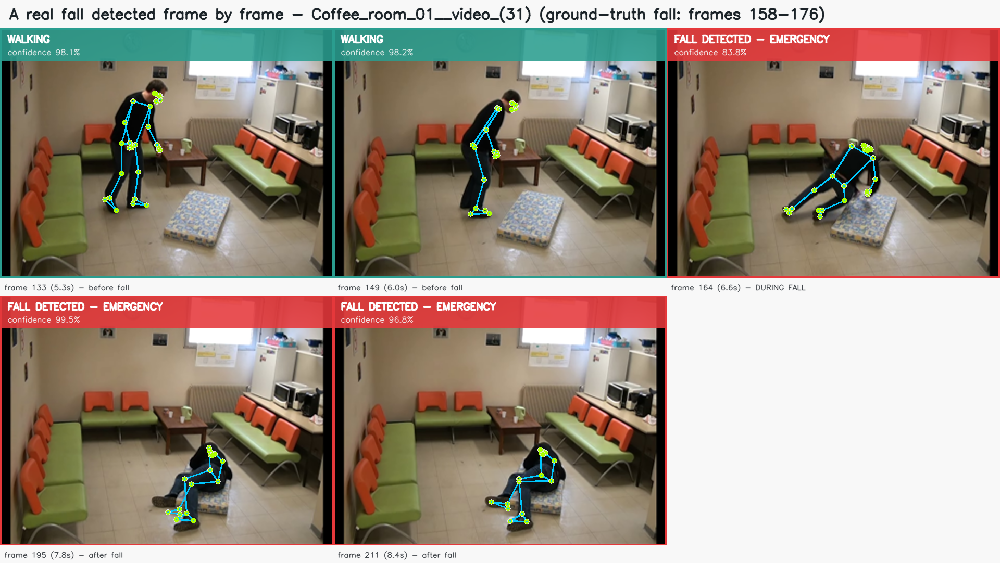

In [18]:
sequence = config.RESULTS_DIR / "fall_sequence.png"
if sequence.exists():
    show(Image(filename=str(sequence)))

## 11. Deployment — running the trained network without TensorFlow

TensorFlow is a ~600 MB dependency, and Streamlit Community Cloud gives an app
1 GB of RAM — which TensorFlow, MediaPipe and OpenCV together will not reliably
fit inside.

Rather than shrink the model or abandon deployment, the trained weights are
exported and the identical architecture is re-implemented in pure NumPy
(`src/numpy_inference.py`). It is the same network doing the same arithmetic.

Crucially, this is **verified rather than asserted**: `python -m src.export_model`
compares both engines across the whole test split and refuses to ship if they
disagree.

In [19]:
parity = json.loads((config.RESULTS_DIR / "engine_parity_check.json").read_text())
for key, value in parity.items():
    print(f"  {key:<28}: {value}")

print()
print(f"The deployed app runs the real trained model from a {parity['weights_file_kb']:.0f} KB file,")
print("on ~40 MB of dependencies instead of ~700 MB.")

  samples                     : 1975
  max_abs_difference          : 1.0132789611816406e-06
  mean_abs_difference         : 3.726282216121035e-08
  predicted_class_agreement   : 1.0
  tolerance                   : 0.0001
  passed                      : True
  weights_file_kb             : 465.3

The deployed app runs the real trained model from a 465 KB file,
on ~40 MB of dependencies instead of ~700 MB.


In [20]:
# Prove it live: run a real frame through the deployed inference path.
from src.inference import SafeFallPredictor

predictor = SafeFallPredictor()
print("Inference engine:", predictor.engine_name)

samples = sorted(config.SAMPLES_DIR.glob("*.jpg"))
if samples:
    import cv2
    for path in samples:
        frame = cv2.imread(str(path))
        result = predictor.predict_image(frame, draw=False, static=True)
        flag = "EMERGENCY" if result.is_fall else "safe"
        print(f"  {path.name[:46]:<46} -> {result.activity:<16} {result.confidence:6.1%}  [{flag}]")
predictor.close()

Inference engine: NumPy (exported Keras weights)


  demo_fall_Coffee_room_01__video_(19).jpg       -> Fall Detected    100.0%  [EMERGENCY]
  demo_fall_Coffee_room_01__video_(20).jpg       -> Fall Detected     99.4%  [EMERGENCY]
  demo_normal_Coffee_room_02__video_(50).jpg     -> Walking           99.3%  [safe]


## 12. Limitations

Stated plainly, because a system like this only gets deployed if you are clear
about where it fails.

* **Weak labels for four of five classes.** Falls are human-annotated; Walking,
  Sitting, Standing and Normal Activity come from a documented rule set. The
  fall-class metrics are the properly supervised ones.
* **Normal Activity is the weakest class (F1 0.53).** It covers bending, reaching
  and crouching — the postures halfway between upright and on the floor — so it
  sits on every decision boundary at once. Notably, **54 % of all the model's
  errors are swaps between two *safe* activities** that never change the alert a
  caregiver sees.
* **Single-frame ambiguity.** Standing and Walking differ by motion, invisible in
  one image. Mitigated by defining the classes on stance and by the video
  pipeline's motion-refinement step.
* **Occlusion.** Furniture hiding hips or legs yields a partial skeleton; a
  usable skeleton was found in 84.8 % of frames.
* **Low light.** Detection degrades in poor lighting — and night is exactly when
  falls are most common. An infrared camera is the practical fix.
* **Dataset realism.** Le2i uses staged falls by younger actors in six rooms.
  Real elderly falls are slower, more varied and often partly occluded, so these
  numbers are an upper bound until validated on genuine care-home footage.

## 13. Future work and retraining

1. A **temporal model** (1-D CNN or LSTM over a window of frames) to separate
   Walking from Standing by motion and to catch slow "slump" falls.
2. **Real elderly footage**, including getting-out-of-bed events and walker users.
3. **Low-light and infrared** data plus brightness/blur augmentation.
4. **Fewer false alerts** — a short "are you OK?" confirmation window before
   escalation, and agreement between two cameras.
5. **Real-time CCTV/RTSP** ingestion with push notifications to caregiver phones.

**The retraining cycle.** Incidents are exported from the dashboard with their
frames and confidences; a clinician confirms or corrects each one; corrections
become new labels; the pipeline re-runs end to end; the model is re-evaluated on
a **frozen test set**, with **fall recall as the release gate** — a drop below
the previous release blocks deployment.

Because labelling is a small, readable rule file rather than a black box, the
class definitions can also be revised and the entire dataset relabelled in
seconds, without re-processing a single video.

## 14. Conclusion

SafeFall AI detects human posture with MediaPipe Pose, classifies five activities
with a two-branch CNN, identifies falls with **87.4 % recall and 0.948 ROC-AUC on
videos it has never seen** (91.8 % recall at the deployed alert threshold), raises
emergency alerts with temporal confirmation, and presents all of it in a deployed
Streamlit dashboard.

Just as importantly, it is honest about what it is: the split is made at video
level, the one clinically critical class is human-supervised, the report says
exactly which classes are not, and the claim that the deployed app runs the real
trained network is verified numerically rather than asserted.

Run the dashboard with:

```bash
python -m streamlit run app.py
```